<a href="https://colab.research.google.com/github/zakku007/internship-toch-AI-ML/blob/main/Day4/imageprepro_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from PIL import Image, ImageEnhance, ImageOps
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import cv2
import os

In [ ]:
image_source_path = "/content/Dataset"

images = []
image_paths = []

for root, dirs, files in os.walk(image_source_path):
    for file in files:
        if file.lower().endswith((".jpg", ".jpeg", ".png", ".bmp")):
            img_path = os.path.join(root, file)
            img = cv2.imread(img_path)

            if img is not None:
                images.append(img)
                image_paths.append(img_path)

print("Total Images Loaded:", len(images))

Total Images Loaded: 19


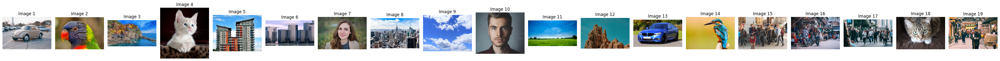

In [ ]:
plt.figure(figsize=(40,40))

for i in range(len(images)):

    img_rgb = cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB)

    plt.subplot(1,19,i+1)
    plt.imshow(img_rgb)
    plt.title(f"Image {i+1}")
    plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:

image_info = []

for path, img in zip(image_paths, images):

    height = img.shape[0]
    width = img.shape[1]
    channels = img.shape[2]

    image_info.append([
        os.path.basename(path),
        height,
        width,
        channels
    ])

df = pd.DataFrame(
    image_info,
    columns=["Image Name","Height","Width","Channels"]
)

print(df)

        Image Name  Height  Width  Channels
0         car2.jpg    1500   2250         3
1        bird1.jpg    2239   3380         3
2   landscape1.jpg    1085   2005         3
3      kitten1.jpg    2500   2392         3
4   buildings3.jpg    3888   5184         3
5   buildings1.jpg    1331   2544         3
6        face1.jpg    3840   5760         3
7   buildings2.jpg    3620   5833         3
8         sky1.jpg    2304   3072         3
9        face2.jpg    4000   4684         3
10  landscape3.jpg    2548   4831         3
11  landscape2.jpg    2609   4120         3
12        car1.jpg    2760   4912         3
13       bird2.jpg    1333   2000         3
14     people1.jpg    3477   5215         3
15     market1.jpg    3837   5755         3
16     people2.jpg    3376   6000         3
17     kitten2.jpg    2304   3456         3
18     market2.jpg    3744   5680         3


In [ ]:
df.to_csv("image_details.csv", index=False)

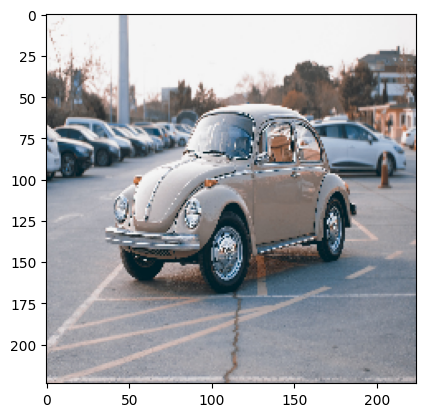

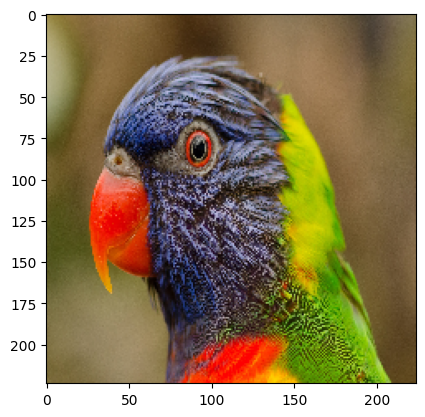

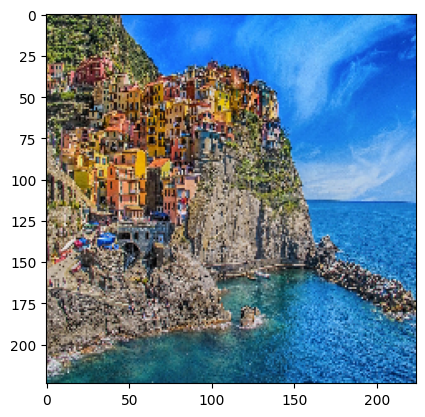

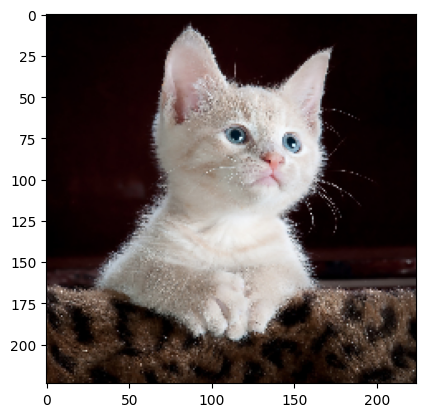

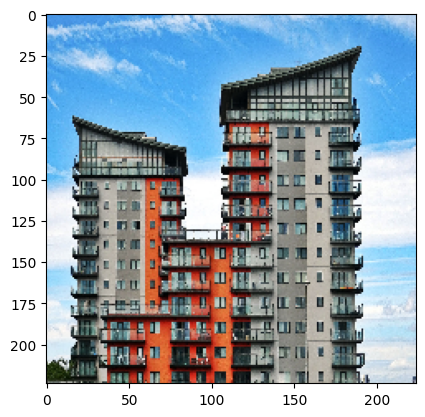

...

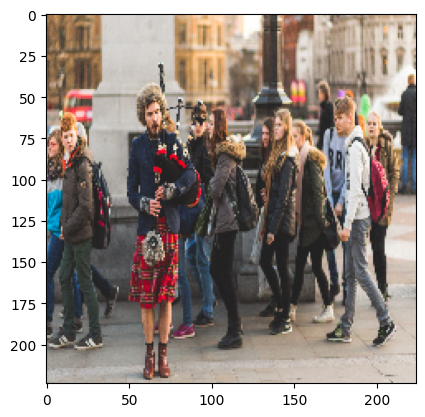

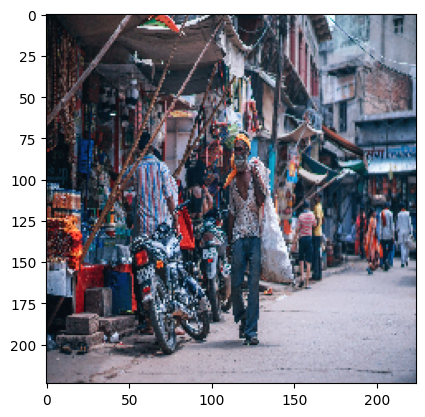

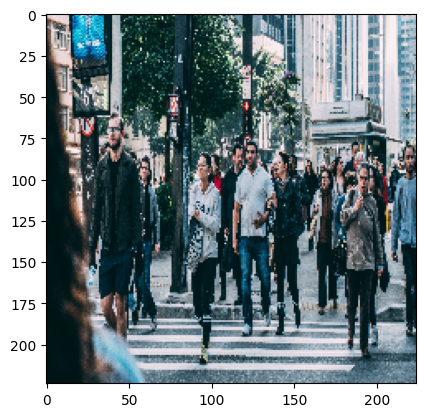

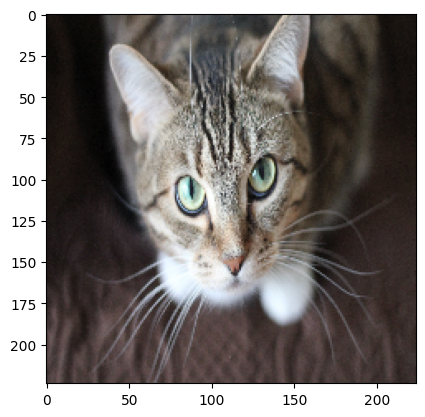

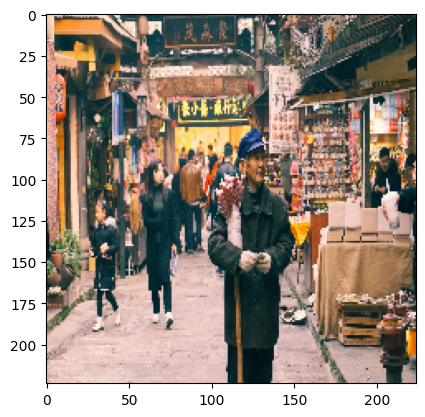

In [ ]:
resized_images = []

for img in images:

    resized = cv2.resize(img, (224,224))

    resized_images.append(resized)

for img in resized_images:
  img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  plt.imshow(img_rgb)
  plt.show()

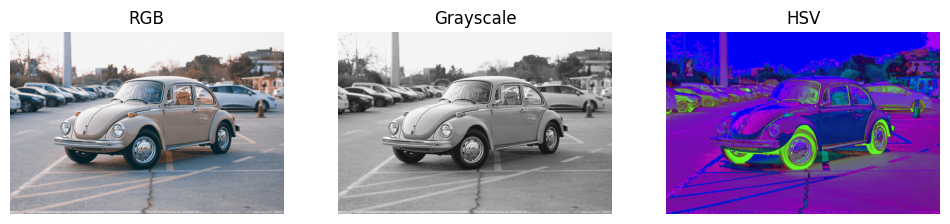

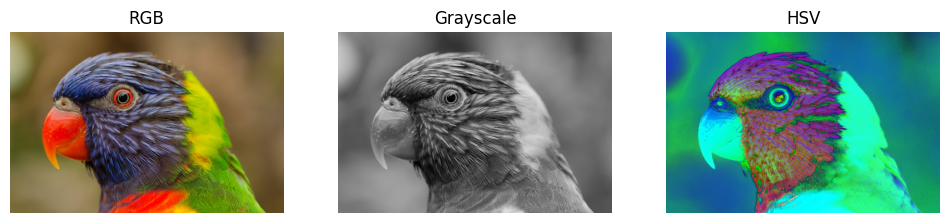

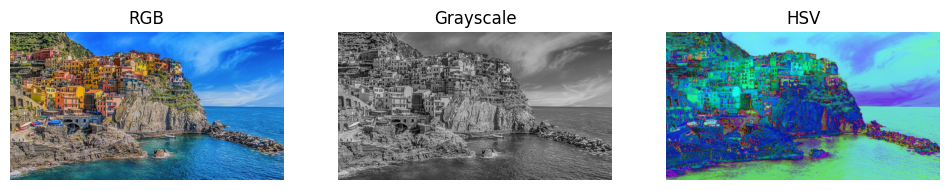

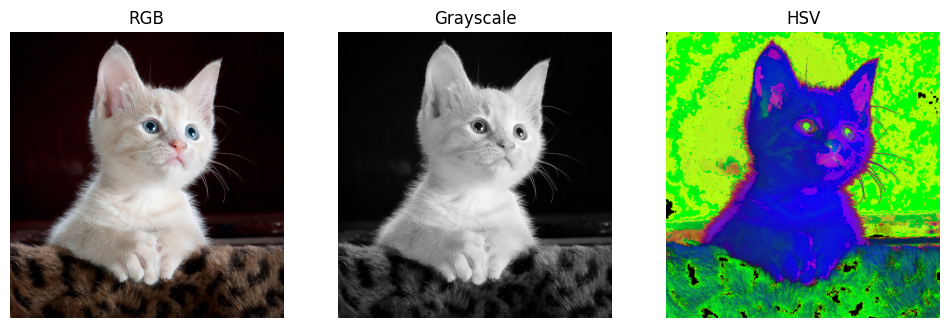

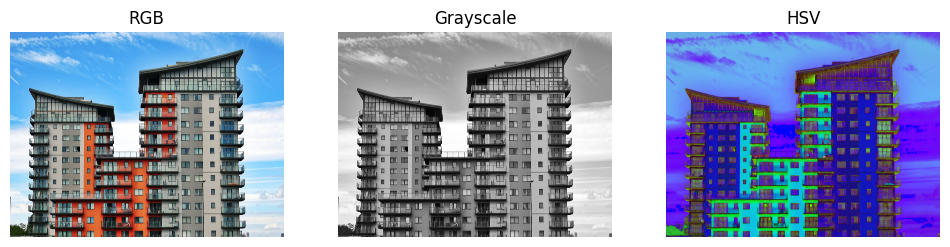

...

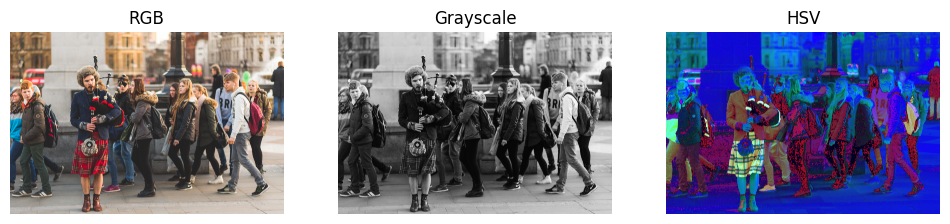

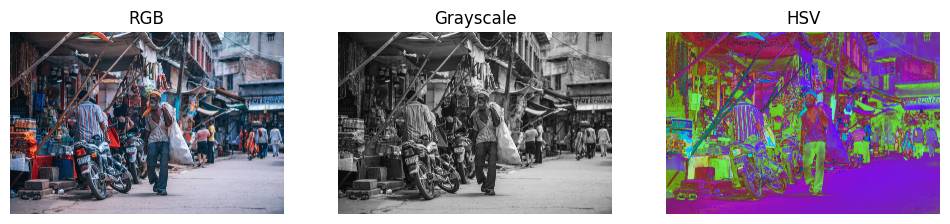

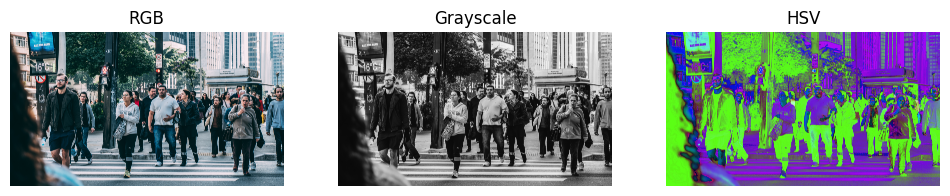

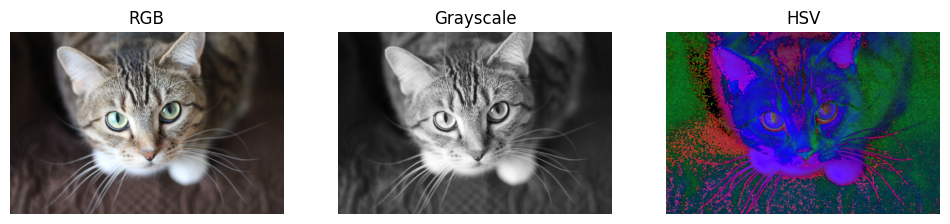

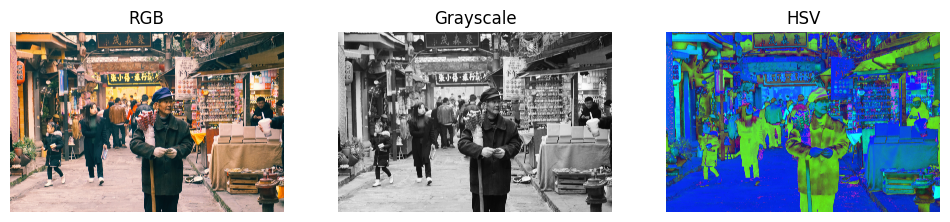

In [ ]:
for sample in images:

  rgb = cv2.cvtColor(sample, cv2.COLOR_BGR2RGB)
  gray = cv2.cvtColor(sample, cv2.COLOR_BGR2GRAY)
  hsv = cv2.cvtColor(sample, cv2.COLOR_BGR2HSV)

  plt.figure(figsize=(12,4))

  plt.subplot(1,3,1)
  plt.imshow(rgb)
  plt.title("RGB")
  plt.axis("off")

  plt.subplot(1,3,2)
  plt.imshow(gray, cmap="gray")
  plt.title("Grayscale")
  plt.axis("off")

  plt.subplot(1,3,3)
  plt.imshow(hsv)
  plt.title("HSV")
  plt.axis("off")

  plt.show()

In [ ]:
norm = []
for img in images:
  normalized = img / 255.0
  norm.append(normalized)
print(norm)

[array([[[1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        ...,
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ]],

       [[0.95686275, 0.95686275, 0.95686275],
        [0.95686275, 0.95686275, 0.95686275],
        [0.95686275, 0.95686275, 0.95686275],
        ...,
        [0.9372549 , 0.9372549 , 0.9372549 ],
        [0.9372549 , 0.9372549 , 0.9372549 ],
        [0.9372549 , 0.9372549 , 0.9372549 ]],

       [[0.96078431, 0.96078431, 0.96078431],
        [0.96078431, 0.96078431, 0.96078431],
        [0.96078431, 0.96078431, 0.96078431],
        ...,
        [0.9372549 , 0.9372549 , 0.9372549 ],
        [0.93333333, 0.93333333, 0.93333333],
        [0.93333333, 0.93333333, 0.93333333]],

       ...,

       [[0.70196078, 0.70588235, 0.76078431],
        [0.69019608, 0.69411765, 0.74901961],
        [0.67058824, 

In [ ]:
pil_img = Image.fromarray(rgb)

In [ ]:
flipped = ImageOps.mirror(pil_img)

In [ ]:
rotated = pil_img.rotate(30)

In [ ]:
enhancer = ImageEnhance.Brightness(pil_img)
bright = enhancer.enhance(1.5)
bright

In [ ]:
img_np = np.array(pil_img)
h, w = img_np.shape[:2]
crop = img_np[50:h-50, 50:w-50]
zoomed = Image.fromarray(crop)
zoomed = zoomed.resize((w,h))

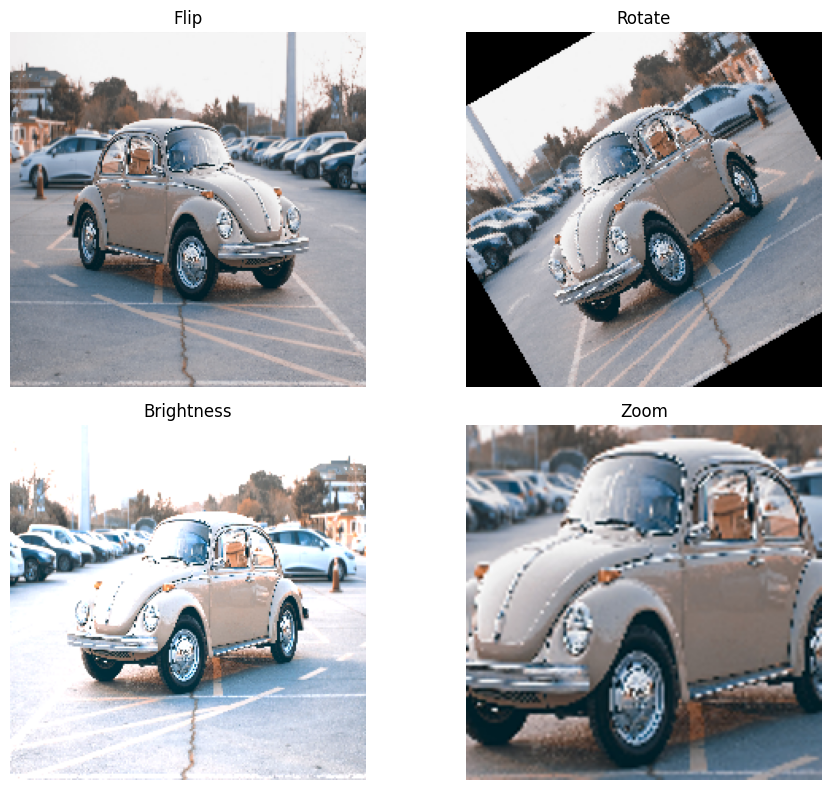

In [ ]:
plt.figure(figsize=(10,8))

plt.subplot(2,2,1)
plt.imshow(flipped)
plt.title("Flip")
plt.axis("off")

plt.subplot(2,2,2)
plt.imshow(rotated)
plt.title("Rotate")
plt.axis("off")

plt.subplot(2,2,3)
plt.imshow(bright)
plt.title("Brightness")
plt.axis("off")

plt.subplot(2,2,4)
plt.imshow(zoomed)
plt.title("Zoom")
plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
def preprocess_image(image_path):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (224,224))
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    normalized = rgb / 255.0

    return rgb, gray, hsv, normalized

In [ ]:
rgb, gray, hsv, normalized = preprocess_image(image_paths[0])

print("RGB Shape:", rgb.shape)
print("Gray Shape:", gray.shape)
print("HSV Shape:", hsv.shape)
print("Normalized Shape:", normalized.shape)

RGB Shape: (224, 224, 3)
Gray Shape: (224, 224)
HSV Shape: (224, 224, 3)
Normalized Shape: (224, 224, 3)
